In [1]:
import pydss
import numpy as np
from bokeh.io import output_notebook, show
from bokeh.plotting import figure
from bokeh.layouts import gridplot
from bokeh.models import ColumnDataSource, HoverTool, CustomJS
output_notebook()

Loading BokehJS ...

In [2]:
from imp import reload
import pydss
import time
pydss = reload(pydss)

t_0 = time.time()
sys1 = pydss.pydss('thermal_test.json')
sys1.pf_eval()
print('time: {:2.3f}'.format(time.time() - t_0))
s_0 = sys1.pq_3pn

time: 0.512


In [3]:
sys1.pq_3pn = s_0
sys1.pf_eval()
sys1.get_v()
sys1.get_i()

In [4]:
%timeit sys1.pf_eval()

1000 loops, best of 3: 334 µs per loop


In [5]:
sys1.bokeh_tools()

p = figure(width=600, height=800,
           title='European LV Network (CIGRE)', 
           x_range=[-20,20], y_range=[-50, 10])

# lines:
source = ColumnDataSource(sys1.line_data)
lin = p.multi_line(source=source, xs='x_s', ys='y_s', color="red", alpha=0.5, line_width=5)

# buses:
source = ColumnDataSource(sys1.bus_data)
cr = p.circle(source=source, x='x', y='y', size=15, color="navy", alpha=0.5)

p.add_tools(HoverTool(renderers=[lin], tooltips=sys1.line_tooltip))
p.add_tools(HoverTool(renderers=[cr], tooltips=sys1.bus_tooltip))
show(p)


In [37]:
import time 
from imp import reload
import pydss
pydss = reload(pydss)

In [87]:
sys1 = pydss.pydss('thermal_test.json')
t0 = time.time()
sys1.N_steps = 170000
sys1.pf_eval()
sys1.run_eval()
print('time: {:f}'.format(time.time()-t0))

time: 4.267027


In [88]:
fig = figure(width=600, height=300)
T = sys1.params_run[0]['T']
I = sys1.params_run[0]['out_cplx_i']
N = sys1.params_run[0].N_outs
#X = sys1.system.X
decim = 1
for it in range(4):
    colors = ['red','green','blue','black']
    fig.line(T[0:N:decim,0],np.abs(I[0:N,it]), color=colors[it%4], line_width=1)
show(fig)

In [99]:
fig = figure(width=600, height=300)
T = sys1.params_run[0]['T']
T_j_igbt = sys1.params_run[0]['T_j_igbt_abcn']
T_sink = sys1.params_run[0]['T_sink']
N = sys1.params_run[0].N_outs
#X = sys1.system.X
decim = 10
colors = ['red','green','blue','black']
for it in range(3):    
    fig.line(T[0:N:decim,0],T_j_igbt[0:N:decim,it+0].real, color='red', line_width=1.5)
fig.line(T[0:N:decim,0],T_sink[0:N:decim,0].real, color='green', line_width=2)
show(fig)

ValueError: no field of name T_j_diode_abcn

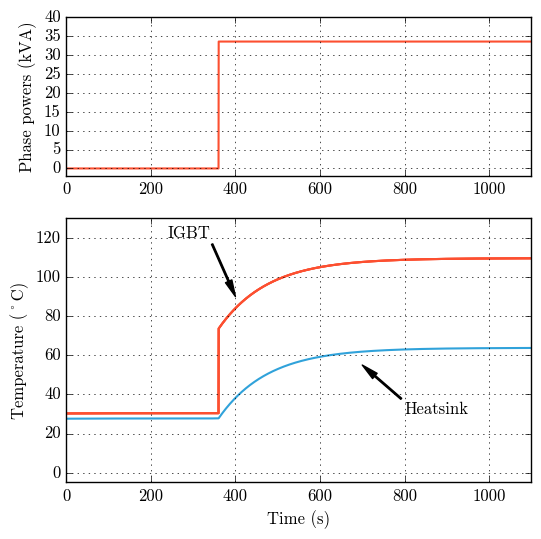

In [112]:
from matplotlib import pyplot as plt
%matplotlib inline
plt.style.use('ieee.mplstyle')
color_cycle =['#fc4f30', '#5cb85c', '#30a2da',  '#e5ae38',  '#8b8b8b'] 
N_ini = int(N*0.2)
t_ini = T[N_ini,0]
fig, (ax0,ax1) = plt.subplots(nrows=2,  gridspec_kw = {'height_ratios':[1.2, 2]})   # creates a figure with one axe
fig.set_size_inches(6,6)

ax0.plot(T[N_ini:N:decim,0]-t_ini,np.abs(I[N_ini:N:decim,0])*231/1000, color=color_cycle[0])
ax1.plot(T[N_ini:N:decim,0]-t_ini,T_j_igbt[N_ini:N:decim,0].real, color=color_cycle[0])
ax1.plot(T[N_ini:N:decim,0]-t_ini,T_j_igbt[N_ini:N:decim,1].real, color=color_cycle[0])
ax1.plot(T[N_ini:N:decim,0]-t_ini,T_j_igbt[N_ini:N:decim,2].real, color=color_cycle[0])

ax1.plot(T[N_ini:N:decim,0]-t_ini,T_sink[N_ini:N:decim,0].real, color=color_cycle[2])

ax0.set_ylim([-2,40])
ax1.set_ylim([-5,130])
ax0.set_xlim([0,1100])
ax1.set_xlim([0,1100])
ax1.set_xlabel('Time (s)')
ax0.set_ylabel('Phase powers (kVA)')
ax1.set_ylabel('Temperature (ºC)')

ax1.annotate('IGBT', xy=(400, 90), xytext=(240, 120),
            arrowprops=dict(facecolor='black', shrink=0.0,width=1.0,headwidth=5))
ax1.annotate('Heatsink', xy=(700, 55), xytext=(800, 30),
            arrowprops=dict(facecolor='black', shrink=0.0,width=1.0,headwidth=5))

ax0.grid(True)
ax1.grid(True)
plt.show()
fig.savefig('thermal_dynamics_test.svg', bbox_inches='tight')
fig.savefig('thermal_dynamics_test.pdf', bbox_inches='tight')
fig.savefig('thermal_dynamics_test.eps', bbox_inches='tight')

In [93]:
ax0.plot((T[0:N:decim,0],np.abs(I[0:N,it]), color=color_cycle[1])

ax1.plot(tests_fp080_m95[:,15],tests_fp080_m95[:,3], 'o', color=color_cycle[0])
ax1.plot(tests_fp080_m95[:,15],tests_fp080_m95[:,7], 'o', color=color_cycle[1])
ax1.plot(tests_fp080_m95[:,15],T_j_igbt, color=color_cycle[0])
ax1.plot(tests_fp080_m95[:,15],T_j_diode, color=color_cycle[1])
ax1.plot(tests_fp080_m95[:,15],T_sink, color=color_cycle[2])
ax0.set_ylim([-10,350])
ax1.set_xlabel('RMS Current (A)')
ax0.set_ylabel('Loss Power (W)')
ax1.set_ylabel('Temperature (ºC)')

ax0.annotate('IGBT', xy=(100, 150), xytext=(80, 200),
            arrowprops=dict(facecolor='black', shrink=0.0,width=1.0,headwidth=5))
ax0.annotate('Diode', xy=(140, 60), xytext=(150, 120),
            arrowprops=dict(facecolor='black', shrink=0.0,width=1.0,headwidth=5))

ax1.annotate('IGBT', xy=(120, 90), xytext=(80, 120),
            arrowprops=dict(facecolor='black', shrink=0.0,width=1.0,headwidth=5))
ax1.annotate('Diode', xy=(155, 82), xytext=(160, 100),
            arrowprops=dict(facecolor='black', shrink=0.0,width=1.0,headwidth=5))
ax1.annotate('Sink', xy=(145, 55), xytext=(160, 30),
            arrowprops=dict(facecolor='black', shrink=0.0,width=1.0,headwidth=5))
ax0.grid(True)
ax1.grid(True)
plt.show()

SyntaxError: invalid syntax (<ipython-input-93-4d3473b037aa>, line 1)

In [22]:
for it in range(10):
    sys1 = pydss.pydss('thermal_test.json')
    t0 = time.time()
    sys1.N_steps = 10000
    sys1.pq_3pn[0] = np.array([-0.8-0.6j]*3)*10e3*it/3
    sys1.pf_eval()
    
    sys1.run_eval()
    I = sys1.params_run[0]['out_cplx_i']
    N = sys1.params_run[0].N_outs
    print('time: {:f}'.format(time.time()-t0))
    print('T',sys1.params_run[0]['T_j_igbt_abcn'][N,1].real+25)
    print('I',np.abs(I[N,0]).real)
    print('p_gbt',sys1.params_vsc.p_igbt_abcn[0,0])
    print('p_diode',sys1.params_vsc.p_diode_abcn[0,0])

time: 0.086471
T 54.2564428952
I 2.03369197834e-12
p_gbt [ 15.257]
p_diode [ 0.62857]
time: 0.067930
T 54.7927956574
I 14.4560793697
p_gbt [ 17.25520142]
p_diode [ 1.12060728]
time: 0.058324
T 56.5437335033
I 28.9570941593
p_gbt [ 23.86195007]
p_diode [ 2.44616458]
time: 0.050776
T 59.5212824098
I 43.5035055717
p_gbt [ 35.12327184]
p_diode [ 4.61216632]
time: 0.049852
T 63.737671593
I 58.0957826957
p_gbt [ 51.08597025]
p_diode [ 7.62565469]
time: 0.050935
T 69.2053383821
I 72.7344026966
p_gbt [ 71.79764507]
p_diode [ 11.49379244]
time: 0.048986
T 75.9369332465
I 87.4198510119
p_gbt [ 97.3067116]
p_diode [ 16.22386586]
time: 0.048907
T 83.9453249799
I 102.152621554
p_gbt [ 127.66242046]
p_diode [ 21.82328766]
time: 0.048872
T 93.243606048
I 116.933216919
p_gbt [ 162.91487808]
p_diode [ 28.29960018]
time: 0.050238
T 103.845098106
I 131.7621486
p_gbt [ 203.11506781]
p_diode [ 35.6604785]


In [23]:
sys1 = pydss.pydss('thermal_test.json')
t0 = time.time()
sys1.N_steps = 100000
sys1.pq_3pn[0] = np.array([-0.8-0.6j]*3)*95.5e3/3
sys1.pf_eval()
    
sys1.run_eval()
I = sys1.params_run[0]['out_cplx_i']
N = sys1.params_run[0].N_outs
print('time: {:f}'.format(time.time()-t0))
print('T',sys1.params_run[0]['T_j_igbt_abcn'][N,1].real)
print('I',np.abs(I[N,0]).real)
print('p_igbt',sys1.params_vsc.p_igbt_abcn[0,0])
print('p_diode',sys1.params_vsc.p_diode_abcn[0,0])
print('m',sys1.params_vsc.m[0,0])

time: 0.522047
T 100.120218316
I 139.938852628
p_igbt [ 227.35290322]
p_diode [ 40.08883218]
m [ 0.95014613]


In [24]:
0.933/0.95*700


687.4736842105264

In [25]:
fig = figure(width=600, height=300)
T = sys1.params_run[0]['T']
T_j_igbt = sys1.params_run[0]['T_j_igbt_abcn']
T_sink = sys1.params_run[0]['T_sink']
N = sys1.params_run[0].N_outs
#X = sys1.system.X
decim = 100
colors = ['red','green','blue','black']
for it in range(3):    
    fig.line(T[0:N:decim,0],T_j_igbt[0:N:decim,it+0].real, color='red', line_width=1)

fig.line(T[0:N:decim,0],T_sink[0:N:decim,0].real, color='red', line_width=1)

show(fig)

In [14]:
sys1.params_vsc.p_igbt_abcn


array([[[ 227.35290322],
        [ 227.35290322],
        [ 227.35290322],
        [  15.257     ]]])

In [15]:
fig = figure(width=600, height=300)
decim = 1
for it in range(72):
    colors = ['red','green','blue','black']
    
    fig.line(T[0:N:decim,0],np.abs(V[0:N:decim,it]), color=colors[it%4], line_width=1)
fig.line(T[[0,N],0],[231*1.1,231*1.1],  line_width=3, color='red')
fig.line(T[[0,N],0],[231*1.05,231*1.05],  line_width=2, color='red')
fig.line(T[[0,N],0],[231*0.95,231*0.95],  line_width=2, color='blue')
fig.line(T[[0,N],0],[231*0.9,231*0.9],  line_width=3, color='blue')
fig.line(T[[0,N],0],[231,231],  line_width=2, color='green')
show(fig)

NameError: name 'V' is not defined

In [ ]:
T[[0,N],0]

In [ ]:
figp = figure(width=600, height=300)
for it in range(6):
    colors = ['red','green','blue','black']
    P=sys1.system.out_cplx[it+72,:].real/1000
    figp.line(T[:,0],P, color=colors[it%3], line_width=1)
show(figp)

In [ ]:
fig = figure(width=600, height=300)
fig.line(T[:,0],sys1.system.out[24,:], line_width=1)
show(fig)

In [ ]:
import numpy as np
from bokeh.io import output_notebook, show
from bokeh.models import ColumnDataSource
from bokeh.io import push_notebook
from bokeh.layouts import gridplot
from bokeh.plotting import figure
from bokeh.charts import Bar 
import pandas as pd
output_notebook()

sys1.pq_3pn = s_0
sys1.pf_eval()
sys1.get_v()
sys1.get_i()

plt_voltages = figure(width=600, height=300,x_range = [50,-300], y_range = [180,250])
source = ColumnDataSource(sys1.bus_data)
cr = plt_voltages.circle(source=source, x='y', y='v_an', size=15, color="red", alpha=0.5)
plt_voltages.circle(source=source, x='y', y='v_bn', size=15, color="green", alpha=0.5)
plt_voltages.circle(source=source, x='y', y='v_cn', size=15, color="blue", alpha=0.5)
plt_voltages.line([-300, 50],[231*1.05,231*1.05], color='red', line_width=5)
plt_voltages.line([-300, 50],[231*0.90,231*0.90], color='blue', line_width=5)
#plt_voltages.add_tools(HoverTool(renderers=[cr], tooltips=sys1.bus_tooltip))

s = sys1.V_known * np.conj(sys1.I_unknown)
p = s.real/1000

d = {'bus':['N1']*4+['N2']*4,'node':['a','b','c','n']*2,'p':list(p[:,0]), 'pos':range(8)}
#source_powers = pd.DataFrame(d)
source_powers = ColumnDataSource(d)


#plt_powers = Bar(source_powers, values='p',label='bus',  group='node', 
#        title="Avg MPG by ORIGIN, stacked by CYL") #  legend='top_left'
plt_powers = figure(width=600, height=300, y_range = [-100,150], y_axis_label='Powers', x_axis_label='Pos (m)')
plt_powers.circle(source=source_powers, x='pos', y='p', size=15, color="green", alpha=0.5)

def update(load_factor=1.0):

    sys1.pq_3pn = load_factor*s_0

    sys1.pf_eval()
    sys1.get_v()
    sys1.get_i()
    sys1.bokeh_tools()
    s = sys1.system.V_known * np.conj(sys1.system.I_unknown)
    p = s.real/1000

    source.data = sys1.bus_data
    source_powers.data= {'bus':['N1']*4+['N2']*4,'node':['a','b','c','n']*2,'p':list(p[:,0]), 'pos':range(8)}

    push_notebook()

p_grid = gridplot([[plt_voltages], [plt_powers]])
show(p_grid,notebook_handle=True)


#show(p, notebook_handle=True)


In [ ]:
from ipywidgets import interact
interact(update, load_factor=(-1,1.2, 0.01))